## Модель U-Net 

Обучим и сохраним модель, которая будет сегментировать изображения и извлекать проблемные области

In [31]:
import os

import numpy as np
import pandas as pd 

import dill
import joblib

import pydicom

import matplotlib.pyplot as plt

import keras
import skimage
from skimage.measure import label 

import albumentations as A
import segmentation_models as sm

In [2]:
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID' 
os.environ['CUDA_VISIBLE_DEVICES'] = ''

In [3]:
basepath = 'E:\data\For_Publication_v3'

In [4]:
nodules_df = pd.read_csv('data/restricted_nodules')
plans_df = pd.read_csv('data/restricted_plans')

In [5]:
studies_train = joblib.load("data/train")
studies_valid = joblib.load("data/valid")

In [6]:
len(studies_train), len(studies_valid)

(75, 19)

In [7]:
study = studies_train[0]
img_path = nodules_df[nodules_df['study_id'] == study]['dcm_path'].iloc[0]
study, img_path                

('RLSDD01000202417',
 'E:\\data\\For_Publication_v3\\Dicom\\RLADD01000190028_RLSDD01000202417\\CT\\Chest HCT(Glubokiy Vdoh)\\CT_1.2.276.0.7230010.3.1.4.1417964692.10880.1568749036.322444')

In [8]:
def distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

distance(1, 1, 1, 5)

4.0

In [9]:
def get_nodules_for_image(file_path):
    return nodules_df[nodules_df['dcm_path'] == file_path][['x', 'y', 'diameter']]

get_nodules_for_image(img_path)

,x,y,diameter
1244,108.0,269.0,9.0


In [67]:
def show_images(**images):
    n = len(images)
    plt.figure(figsize=(18, 7))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(name)
        if image.shape[-1] == 1:
            image = image.reshape(image.shape[0:-1])
        plt.imshow(image, cmap=plt.cm.bone)
    plt.show()

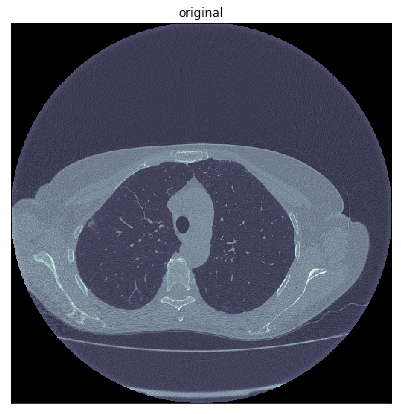

In [68]:
def read_image(file_path):
    return pydicom.read_file(file_path).pixel_array

img = read_image(img_path)
show_images(original=img)

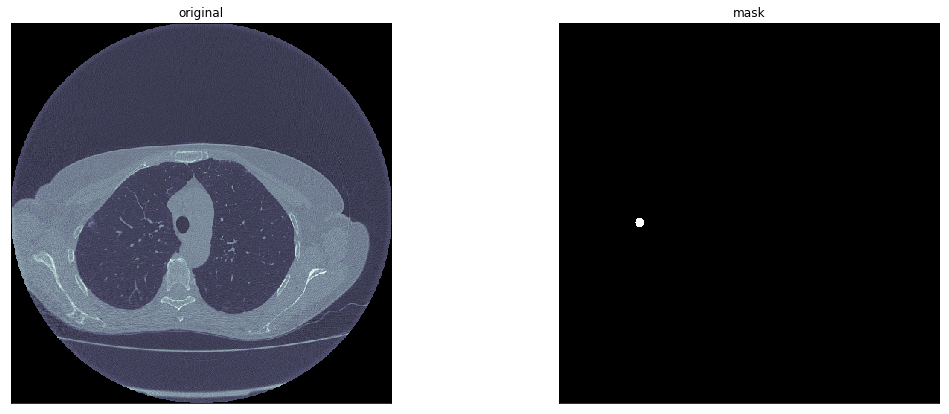

Wall time: 217 ms


In [69]:
%%time
PIXEL_SPACING = 0.736

def create_masked_image(image, nodules_df=None):
    masked = np.zeros(image.shape, np.int16)
    width, height = image.shape
    if nodules_df is not None:
        for index, row in nodules_df.iterrows():
            base_x, base_y = int(row['x']), int(row['y']) 
            radius = int(row['diameter'] / 2.0 * (1 / PIXEL_SPACING))
            for x in range(base_x - radius, base_x + radius):
                for y in range(base_y - radius, base_y + radius):
                    r, c = y, x
                    if (x >= 0 and x < width) and (y >= 0 and  y < height) and distance(base_x, base_y, x, y) <= radius:
                        masked[r, c] = 1
            
    return np.float32(masked)
   
img_ns = get_nodules_for_image(img_path)
img_mask = create_masked_image(img, img_ns)
show_images(original=img, mask=img_mask)

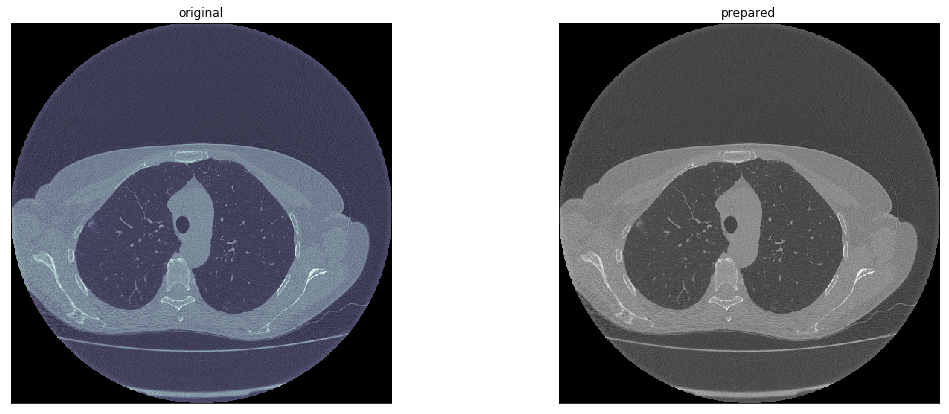

In [70]:
def prepare_image_to_unet(image):
    min_value = image.min()
    if min_value < 0:
        image = image + np.abs(min_value)
    image = image / image.max()
    return np.float32(skimage.color.gray2rgb(image))

prepared_img = prepare_image_to_unet(img)
show_images(original=img, prepared=prepared_img)

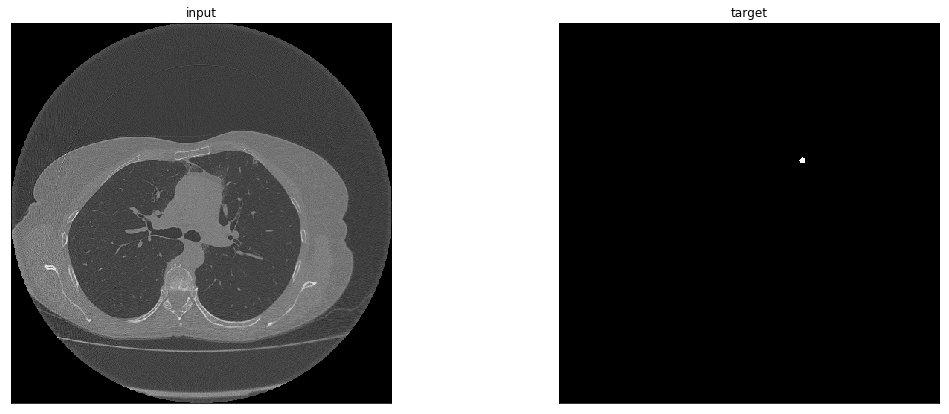

In [71]:
class CTLungDataset:
    def __init__(self, CT_studies):
        self.images_paths =  plans_df[plans_df['study_id'].isin(CT_studies)]['dcm_path'].values
        self.class_values = [0, 1]
        
    def __getitem__(self, i):
        image_path = self.images_paths[i]
        image = read_image(image_path)

        prepared_image = prepare_image_to_unet(image)

        image_nodules = get_nodules_for_image(image_path)
        
        mask_image = create_masked_image(image, image_nodules)
        mask = np.stack([mask_image], axis=-1)
        
        return prepared_image, mask
    
    def get_image_path(self, i):
        return self.images_paths[i]
    
    def __len__(self):
        return len(self.images_paths)

study_dataset = CTLungDataset([study])
in_img, in_msk = (study_dataset[0][0], study_dataset[0][1])
show_images(input=in_img, target=in_msk.reshape(in_msk.shape[0:2]))

In [21]:
BACKBONE = 'resnet50'
BATCH_SIZE = 6
CLASSES = [1]
LR = 0.0001
EPOCHS = 20

In [16]:
model = sm.Unet(BACKBONE, encoder_weights='imagenet', input_shape=(512, 512, 3), classes=1, activation='sigmoid')

Instructions for updating:
Colocations handled automatically by placer.


In [17]:
optim = keras.optimizers.Adam(LR)

total_loss = sm.losses.JaccardLoss()

thresh = 0.8
metrics = [sm.metrics.IOUScore(threshold=thresh), sm.metrics.Precision(threshold=thresh), sm.metrics.Recall(threshold=thresh)]

model.compile(optim, sm.losses.JaccardLoss(), metrics)

In [18]:
class Dataloder(keras.utils.Sequence):
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))
        self.on_epoch_end()

    def __getitem__(self, i):
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]
        
        return batch
    
    def __len__(self):
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

In [19]:
train_dataset = CTLungDataset(studies_train)

valid_dataset = CTLungDataset(studies_valid)

train_dataloader = Dataloder(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloder(valid_dataset, batch_size=1, shuffle=False)
print(len(train_dataset), len(valid_dataset))

callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]

261 73


In [ ]:
#for i in range(0, len(train_dataset)):
#    test_img, test_img_mask = train_dataset[i]
#    if test_img_mask.any():
#        show_images(img=test_img, mask=test_img_mask.reshape(512, 512))

In [22]:
history = model.fit_generator(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader, 
    validation_steps=len(valid_dataloader),
)

Epoch 1/20
43/43 [==============================] - 2531s 59s/step - loss: 0.9993 - iou_score: 0.0016 - precision: 0.0016 - recall: 0.5395 - val_loss: 0.9989 - val_iou_score: 0.0040 - val_precision: 0.0040 - val_recall: 0.7302
Epoch 2/20
43/43 [==============================] - 2512s 58s/step - loss: 0.9991 - iou_score: 0.0031 - precision: 0.0031 - recall: 0.8022 - val_loss: 0.9989 - val_iou_score: 0.0032 - val_precision: 0.0032 - val_recall: 0.7457
Epoch 3/20
43/43 [==============================] - 2510s 58s/step - loss: 0.9989 - iou_score: 0.0056 - precision: 0.0056 - recall: 0.9147 - val_loss: 0.9988 - val_iou_score: 0.0030 - val_precision: 0.0030 - val_recall: 0.6934
Epoch 4/20
43/43 [==============================] - 2505s 58s/step - loss: 0.9987 - iou_score: 0.0098 - precision: 0.0098 - recall: 0.9509 - val_loss: 0.9985 - val_iou_score: 0.0043 - val_precision: 0.0043 - val_recall: 0.6046
Epoch 5/20
43/43 [==============================] - 2515s 58s/step - loss: 0.9985 - iou_scor

In [23]:
joblib.dump(model, f'models/unet_{BACKBONE}_{EPOCHS}')

['models/unet_resnet50_20']

### Оценим результаты на отложенной выборке

Загрузим в модель веса, давшие лучший результат на валидации. После 13 эпохи начала переобучатся  

In [39]:
model.save_weights(f'models/unet_{BACKBONE}_{EPOCHS}_total.h5')

In [40]:
model.load_weights('best_model.h5')

In [41]:
studies_test = joblib.load("data/test")
len(studies_test)

11

In [25]:
test_dataset = CTLungDataset(studies_test)
test_loader = Dataloder(test_dataset)
len(test_dataset)

36

In [44]:
img, img_mask = test_dataset[0]
predicted = model.predict(np.array([test_img]))[0]

In [45]:
def predict_with_threshold(predicted_probs, threshold):
    predicted_mask = np.zeros(predicted_probs.shape, np.int8)
    predicted_mask[predicted_probs >= threshold] = 1
    return predicted_mask    

def get_areas_for_mask(masked_image):
    labeled_areas, labels_num = label(masked_image, return_num=True)
    areas = []
    for i in range(1, labels_num):
        area_mask = np.zeros(masked_image.shape, np.int8)
        area_mask[labeled_areas == i] = 1
        areas.append(area_mask)
    return areas

def get_predicted_areas(predicted, threshold):
    return get_areas_for_mask(predict_with_threshold(predicted, threshold))

areas = get_predicted_areas(predicted.reshape(512,512), 0.8)
len(areas)

25

In [48]:
def make_image_intersection_matrix(predicted_mask, predicted_areas, nodules_areas):
    m_shape = len(predicted_areas), len(nodules_areas)
    matrix = np.zeros(m_shape, np.int8)
    for j in range(0, m_shape[1]):
        if predicted_mask is None or (predicted_mask & nodules_areas[j]).any():
            for i in range(0, m_shape[0]):
                matrix[i, j] = (predicted_areas[i] & nodules_areas[j]).any()
    return matrix

test_inter_m = make_image_intersection_matrix(None, [np.array([[1, 0, 1], [0, 0, 0]]), np.array([[1, 0, 0], [0, 0, 0]]), np.array([[0, 1, 0], [0, 0, 0]])], 
                               [np.array([[0, 0, 1], [0, 0, 0]]), np.array([[1, 0, 0], [0, 0, 0]]), np.array([[0, 0, 0], [0, 1, 0]])])
test_inter_m

array([[1, 1, 0],
       [0, 1, 0],
       [0, 0, 0]], dtype=int8)

In [49]:
def get_confusions(inter_matrix):
    tp = sum([inter_matrix[:, c].any() for c in range(0, inter_matrix.shape[1])])
    fp = inter_matrix.shape[0] - sum([inter_matrix[r, :].any() for r in range(0, inter_matrix.shape[0])])
    fn = inter_matrix.shape[1] - tp
    return tp, fp, fn

tp, fp, fn = get_confusions(test_inter_m)
tp, fp, fn

(2, 1, 1)

In [50]:
def get_metrics(tp, fp, fn):
    precision, recall = tp / (tp + fp), (tp / (tp + fn) if  (tp + fn) > 0 else 0) 
    return precision, recall
    
get_metrics(tp, fp, fn)

(0.6666666666666666, 0.6666666666666666)

In [56]:
predicted_probas = []
for i in range(0, len(test_dataset)):
    test_img, _ = test_dataset[i]
    proba_map = model.predict(np.array([test_img]))[0]
    predicted_probas.append(proba_map) 

In [79]:
%%time
def get_metrics_by_areas(image_path, image_mask, predicted_proba_map, threshold):
        image_nodules = get_nodules_for_image(image_path)
        nodule_areas = [create_masked_image(np.zeros(shape=(512, 512)), pd.DataFrame(data=[image_nodules.iloc[k, :]], index=[0])).astype(np.int8) for k in range(0, len(image_nodules))]
        predicted_mask = predict_with_threshold(predicted_proba_map, threshold)
        predicted_areas = get_areas_for_mask(predicted_mask)
        ares_inter_m = make_image_intersection_matrix(predicted_mask, predicted_areas, nodule_areas)
        tp, fp, fn = get_confusions(ares_inter_m)
        return tp, fp, fn
    
get_metrics_by_areas(test_dataset.get_image_path(0), test_dataset[0][1], predicted_probas[0], 0.7)

Wall time: 5.86 s


(1, 24, 0)

In [ ]:
areas_metrics = []
for ths in np.arange(0.5, 1, 0.05):
    total_tp, total_fp, total_fn = 0, 0, 0

    iou_metric = sm.metrics.IOUScore(threshold=ths)
    geo_recall_metric = sm.metrics.Recall(threshold=ths)
    geo_precision_metric = sm.metrics.Precision(threshold=ths)
    total_iou, total_geo_recall, total_geo_precision = 0, 0, 0
    
    for i in range(0, len(test_dataset)):      
        original_map = test_dataset[i][1]
        predicted_map = predict_with_threshold(predicted_probas[i], ths)
        
        total_geo_recall += keras.backend.eval(geo_recall_metric(original_map, predicted_map))
        total_geo_precision += keras.backend.eval(geo_precision_metric(original_map, predicted_map))
        total_iou += keras.backend.eval(iou_metric(original_map, predicted_map))
        
        tp, fp, fn = get_metrics_by_areas(test_dataset.get_image_path(i), original_map, predicted_probas[i], ths)
        total_tp += tp
        total_fp += fp
        total_fn += fn
    
    iou, square_precision, square_recall = total_iou / len(test_dataset), total_geo_precision / len(test_dataset), total_geo_recall / len(test_dataset), 
    precision, recall = get_metrics(total_tp, total_fp, total_fn)
    
    areas_metrics.append((ths, total_tp, total_fp, total_fn, precision, recall, iou, square_precision, square_recall))

areas_metrics_df = pd.DataFrame(data=areas_metrics, columns=('Threshold', 'TP', 'FP', 'FN', 'Precision', 'Recall', 'IoU', 'Geo Precision', 'Geo Recall'))
areas_metrics_df

In [118]:
best_threshold = 0.6

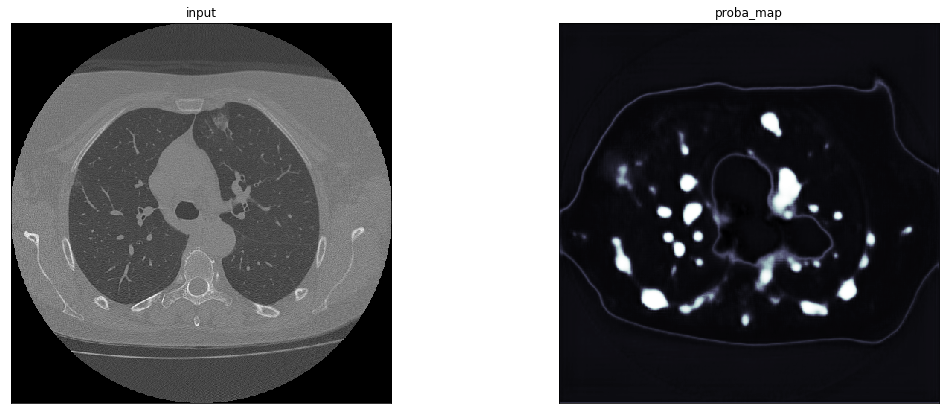

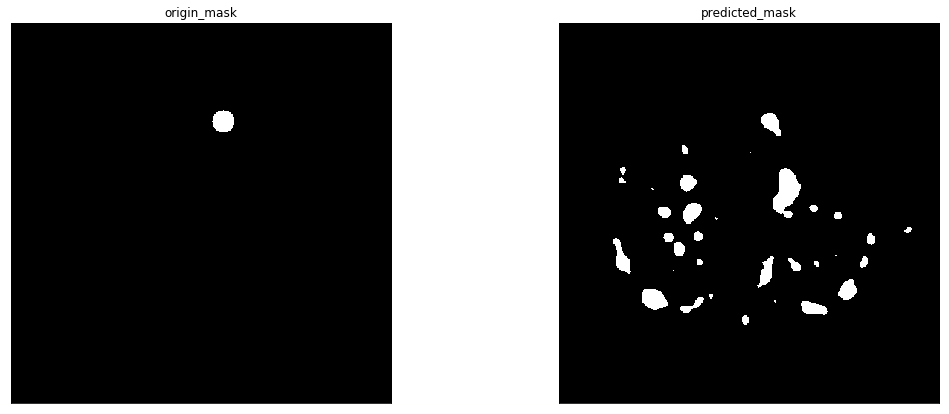

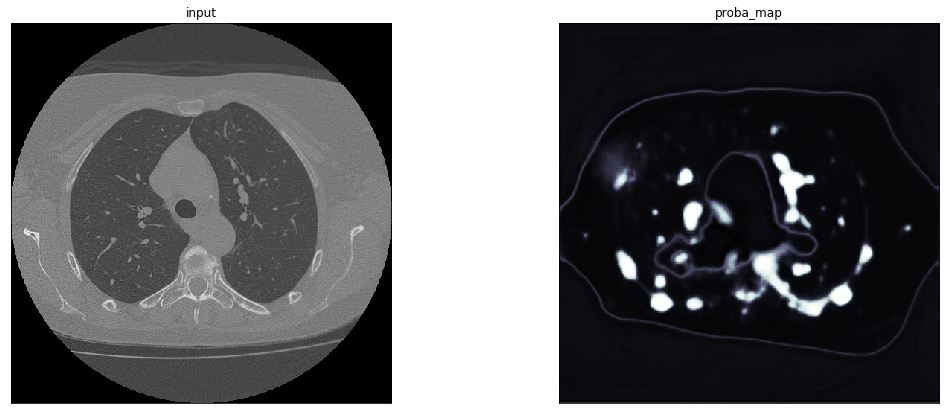

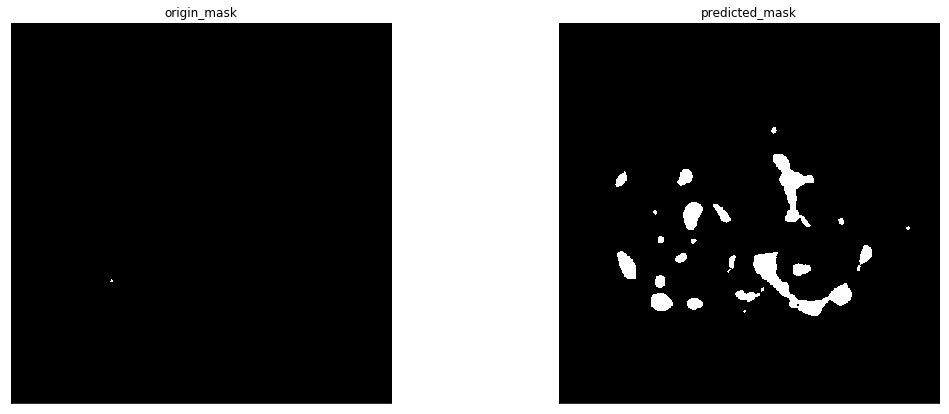

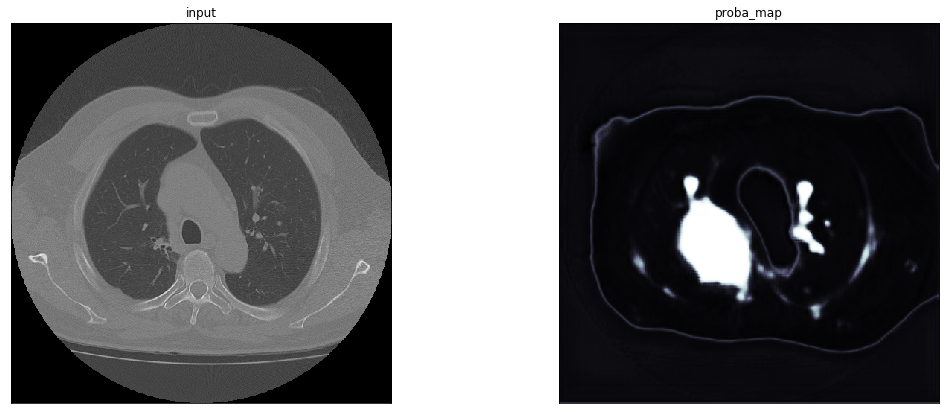

...

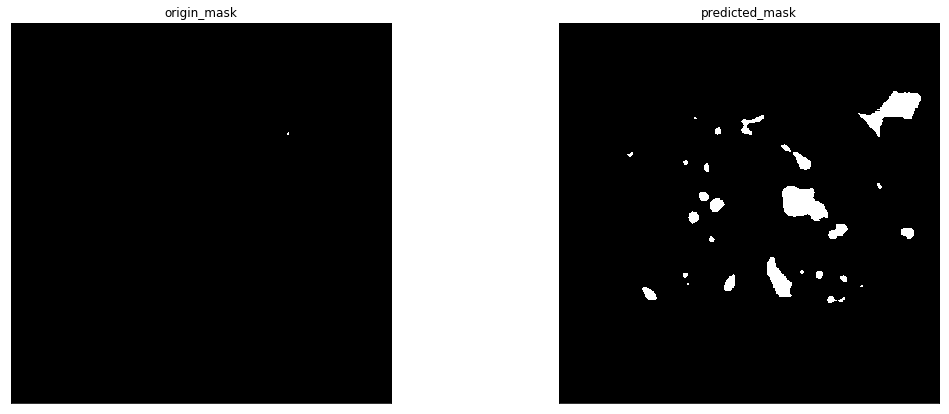

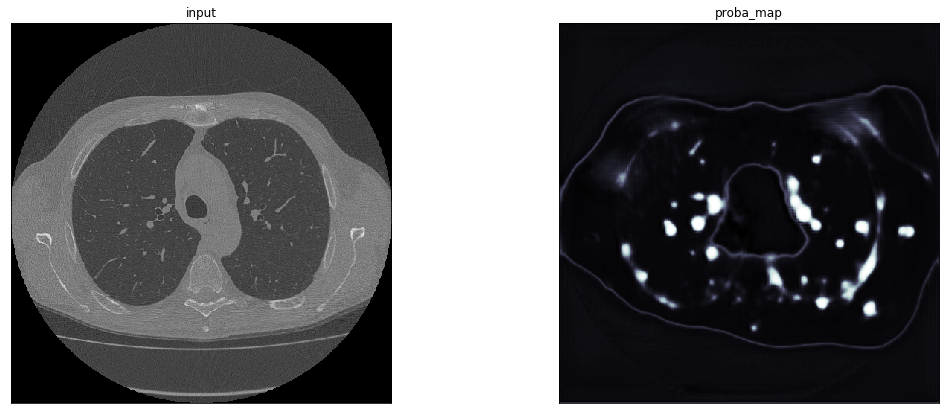

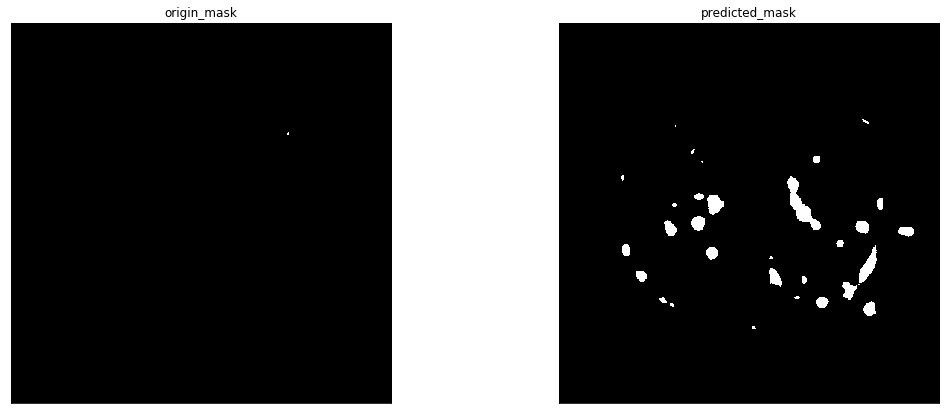

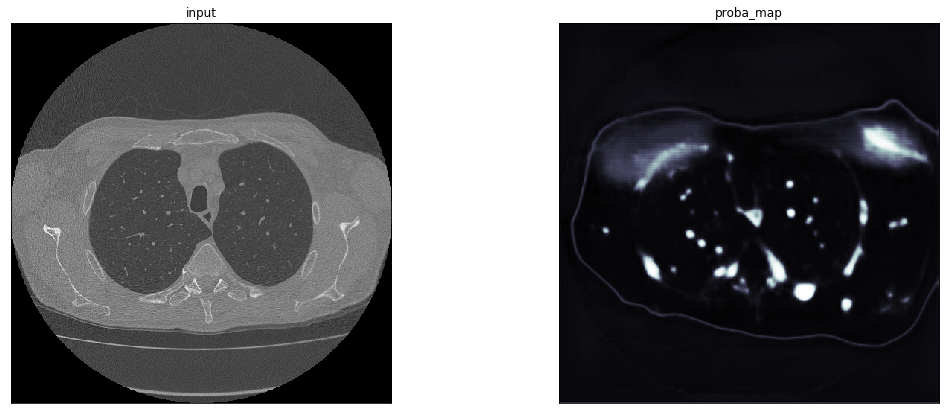

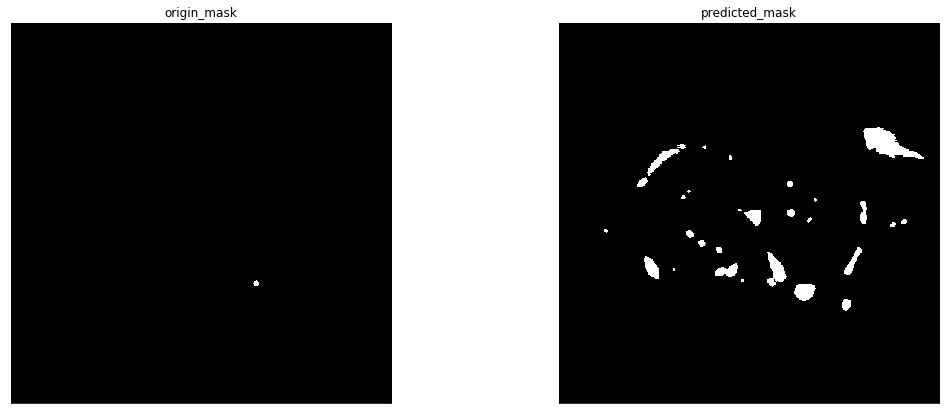

In [119]:
for i in range(0, len(test_dataset)):
    test_img, test_img_mask = test_dataset[i]
    print(f'Test sample {test_dataset.get_image_path(i)}')
    show_images(input=test_img, 
                proba_map=predicted_probas[i])
    show_images(origin_mask=test_img_mask,
                predicted_mask=predict_with_threshold(predicted_probas[i], best_threshold))